In [25]:
import PIL
from PIL import Image

import numpy as np

import matplotlib.pyplot as plt

# from IPython import display
from IPython.display import display

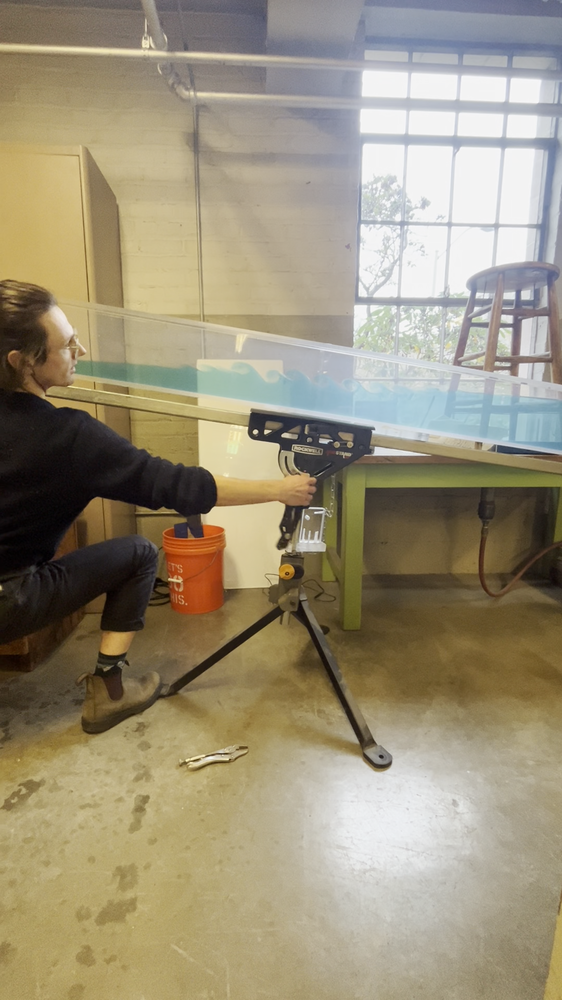

In [26]:
image = Image.open('../../data/test_run_cool_0222.png')
# image.thumbnail((500, 500))
display(image)

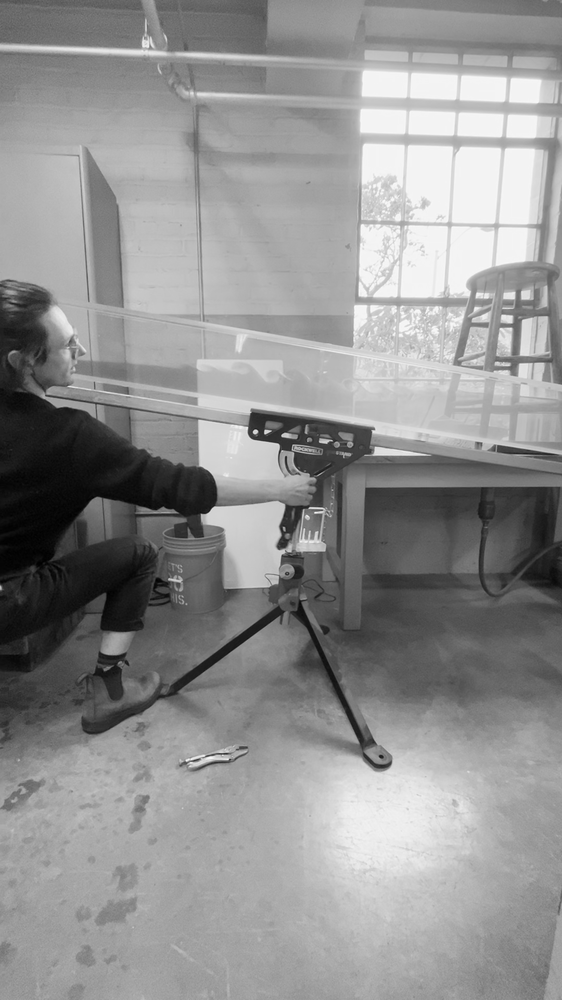

In [27]:
grayscale = image.convert('L')
display(grayscale)

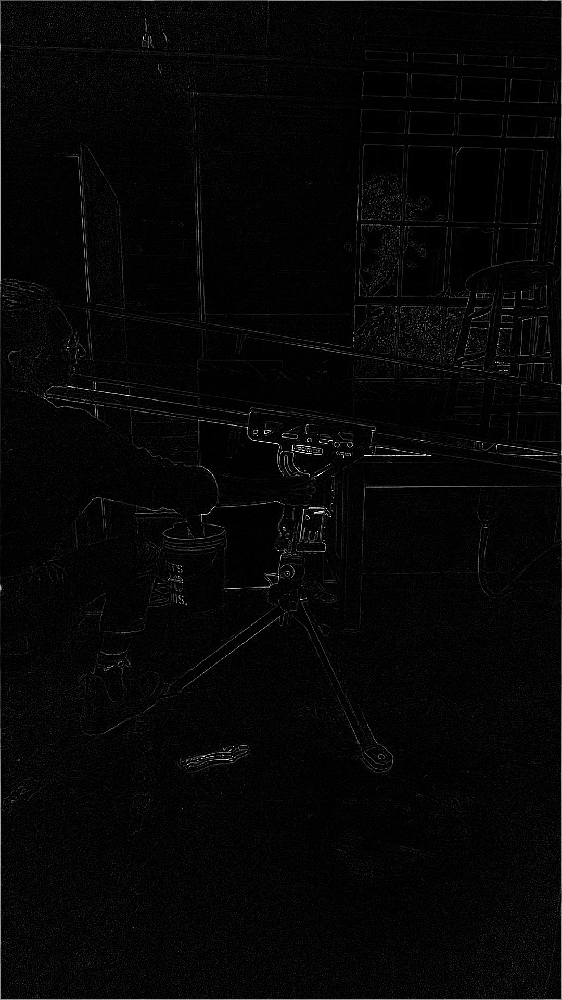

In [28]:
from PIL import ImageFilter

edges = grayscale.filter(ImageFilter.FIND_EDGES)
display(edges)

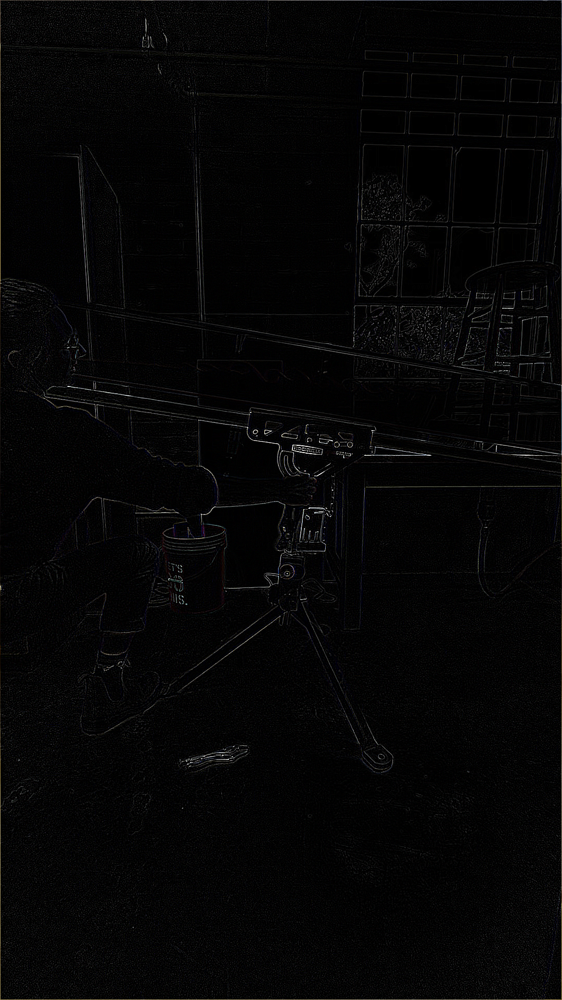

In [29]:
display(image.filter(ImageFilter.FIND_EDGES))

In [ ]:
f223 = Image.open('../../data/test_run_frames/0223.png')
f223bw = f223.convert('L')
f223edge = f223bw.filter(ImageFilter.FIND_EDGES)
# display(f223edge)

In [40]:
from PIL import ImageOps, ImageChops

f223inverted = ImageOps.invert(f223bw)
f223r, f223g, f223b, f223alpha = f223inverted.convert('RGBA').split()
f223alpha = f223alpha.point(lambda a: 0.5 * a)
f223transparent = Image.merge('RGBA', (f223r, f223g, f223b, f223alpha)).convert('L')

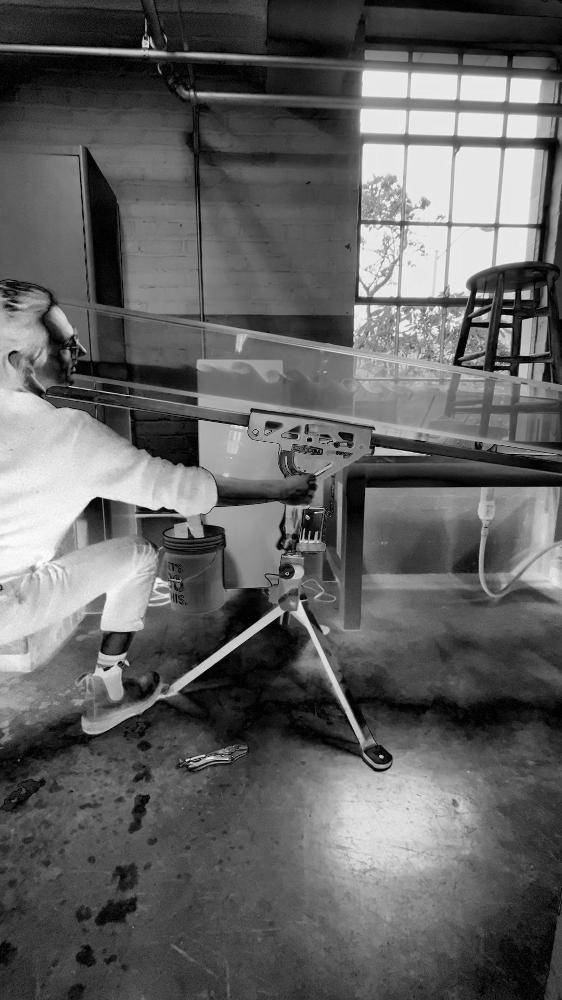

In [45]:
display(ImageChops.difference(grayscale, f223transparent))

In [47]:
from kh_instability.image_processing import video_to_array

# This takes a hot sec
arr = video_to_array('../../data/test_run.MOV')

In [48]:
arr.shape

(687, 1080, 1920, 3)

In [ ]:
def to_grayscale(video):
    """
    Args:
        video: (frames, width, height, 3)
    """
    return (np.linalg.norm(video, axis=-1) / np.sqrt(3)).astype('uint8')

def grayscale_invert(video):
    return 255 - video

def find_edges(video):
    kernel = np.array([[-1, -1, -1],
                       [-1, 8, -1],
                       [-1, -1, -1]], dtype=np.uint8)
    
    return np.convolve(video, kernel, mode='valid')

def absolute_difference(video1, video2):
    return np.abs(np.diff(video1, video2))

def scale_transparency(video, scale=0.5):
    transparent = np.clone(video)
    transparent[-1] *= scale
    return transparent

In [50]:
bw = to_grayscale(arr)

MemoryError: Unable to allocate 31.8 GiB for an array with shape (687, 1080, 1920, 3) and data type float64